# Consensus Whole Mouse Brain #1: Clustering and Annotations

The Consensus, Whole Mouse Brain (WMB) integrated taxonomy is built upon two publicly released transcriptionally defined WMB taxonomies: one derived from single-cell RNA sequencing (scRNA-seq) data and the other from single-nucleus RNA sequencing (snRNA-seq) data. The [Allen Institute for Brain Science (AIBS) taxonomy](https://alleninstitute.github.io/abc_atlas_access/descriptions/WMB-taxonomy.html), based on over 4 million scRNA-seq profiles, defines 5,322 clusters organized hierarchically into 34 classes, 338 subclasses, and 1,201 supertypes. The set of data products for this release can be found [here](https://alleninstitute.github.io/abc_atlas_access/descriptions/WMB_dataset.html). In parallel, the Broad Institute taxonomy, constructed from 4.4 million snRNA-seq profiles, defines 16 classes, 223 metaclusters, and 5,030 clusters. Integrating these two large-scale taxonomies into a unified framework represents a natural and impactful next step, enabling a consensus view of cell types across the entire mouse brain and benefiting the broader neuroscience community.

To generate this consensus taxonomy, we applied the AIBS Quality Control (QC) and post-integration QC pipelines, retaining 7,651,713 cells and nuclei. Integration of scRNA-seq and snRNA-seq data was performed using scVI, with subsampling by original clusters to mitigate sampling imbalance across cell types and brain regions, followed by projection of all remaining cells into a shared latent space. The same iterative clustering strategy used in the AIBS taxonomy was applied in a hierarchical manner—globally, at nine neighborhood levels, and across eight finer group levels. The resulting comprehensive taxonomy comprises a hierarchically arranged set of cell types with 9 neighborhoods, 43 classes, 414 subclasses, 1,386 supertypes, and 6,721 clusters. A detailed cell type annotation table accompanies the taxonomy, including hierarchical membership, anatomical localization, and neurotransmitter identity. All associated metadata is publicly available as an AWS Public Dataset hosted on Amazon S3 and through the Allen Brain Cell Atlass Access (abc_atlas_access) package.

Below we explore this taxonomy and combine it with cell and other metadata, visualizing the data in a 2d spatial projection and summary statistics.

In [1]:
%matplotlib inline

import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache

We will interact with the data using the **AbcProjectCache**. This cache object downloads data requested by the user, tracks which files have already been downloaded to your local system, and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing the package.

**Change the download_base variable to where you would like to download the data in your system.**

In [2]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base
)

abc_cache.current_manifest

'releases/20260131/manifest.json'

## Data overview

Below we list the files available with the Consensus Mouse data release. There are three main packages: Consensus-WMB-AIBS-10X, Consensus-WMB-Macosko-10X, and Consensus-WMB-integrated-taxonomy.

For the Consensus-WMB-AIBS-10X there are no new expression matrices, all gene expression is the same as the previous WMB release and we reuse those files, see the [gene expression tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_10X_snRNASeq.html) for more details on using the gene expression data. This release provides updated cell metadata. While there is significant overlap between the previous WMB AIBS release and this Consensus WMB release, there are a fraction of cells in this metadata that are not in the previous release and vice versa.

Below we list the available metadata files for WMB-AIBS in the consensus release. The expression matrices are part of the previously released [WMB-10Xv2](https://alleninstitute.github.io/abc_atlas_access/descriptions/WMB-10Xv2.html) and [WMB-10Xv3](https://alleninstitute.github.io/abc_atlas_access/descriptions/WMB-10Xv3.html) packages.

In [3]:
print("Consensus-WMB-AIBS-10X: metadata \n\t",
      abc_cache.list_metadata_files(directory='Consensus-WMB-AIBS-10X'))

Consensus-WMB-AIBS-10X: metadata 
	 ['cell_metadata', 'donor', 'example_gene_expression', 'library', 'value_sets']


Next we list the available expression matrix and metadata files in the WMB-Macosko directories. The expression matrices are divided similarlly to those in the WMB-AIBS release, that is by coarse brain region. The metadata are similarly structured to those in the WMB-AIBS portion of the data listed above.

In [4]:
print("Consensus-WMB-Macosko-10X: gene expression data (h5ad)\n\t",
      abc_cache.list_expression_matrix_files(directory='Consensus-WMB-Macosko-10X'))
print("Consensus-WMB-Macosko-10X: gene expression data (h5ad)\n\t",
      abc_cache.list_metadata_files(directory='Consensus-WMB-Macosko-10X'))

Consensus-WMB-Macosko-10X: gene expression data (h5ad)
	 ['Macosko-10X-CB/log2', 'Macosko-10X-CB/raw', 'Macosko-10X-HPF/log2', 'Macosko-10X-HPF/raw', 'Macosko-10X-HY/log2', 'Macosko-10X-HY/raw', 'Macosko-10X-Isocortex/log2', 'Macosko-10X-Isocortex/raw', 'Macosko-10X-MB/log2', 'Macosko-10X-MB/raw', 'Macosko-10X-MY-Pons-BS/log2', 'Macosko-10X-MY-Pons-BS/raw', 'Macosko-10X-OLF/log2', 'Macosko-10X-OLF/raw', 'Macosko-10X-PAL/log2', 'Macosko-10X-PAL/raw', 'Macosko-10X-STR/log2', 'Macosko-10X-STR/raw', 'Macosko-10X-TH/log2', 'Macosko-10X-TH/raw']
Consensus-WMB-Macosko-10X: gene expression data (h5ad)
	 ['cell_metadata', 'donor', 'example_gene_expression', 'gene', 'library', 'value_sets']


Finally, we list the metadata files that make up the consensus taxonomy. This data includes 2d projections for all cells as well as the cells in each neighborhood. We'll show how to join the taxonomy with the cell metadata files listed above later in this notebook.

In [5]:
print("Consensus-WMB-integrated-taxonomy: metadata (csv)\n\t", abc_cache.list_metadata_files(directory='Consensus-WMB-integrated-taxonomy'))

Consensus-WMB-integrated-taxonomy: metadata (csv)
	 ['HY-EA-Glut-GABA_cell_2d_embedding_coordinates', 'MB-GABA_cell_2d_embedding_coordinates', 'MB-Glut-Dopa-Sero_cell_2d_embedding_coordinates', 'NN-IMN_cell_2d_embedding_coordinates', 'P-MY-CB-GABA_cell_2d_embedding_coordinates', 'P-MY-CB-Glut_cell_2d_embedding_coordinates', 'Pallium-Glut_cell_2d_embedding_coordinates', 'Subpallium-GABA_cell_2d_embedding_coordinates', 'TH-EPI-Glut_cell_2d_embedding_coordinates', 'cell_2d_embedding_coordinates', 'cell_to_cluster_membership', 'cluster', 'cluster_annotation_term', 'cluster_annotation_term_set', 'cluster_to_cluster_annotation_membership']


### Cell metadata

Below we load the metadata for each cell in both the WMB-Macosko and WMB-AIBS portion of the data. These contain base information of the cell's ID, its barcode and barcoded_cell_sample (if available), the library the cell comes from and two columns defining which h5ad file a given cell's gene expression is located.

Below we load both the WMB-Macosko and WMB-AIBS cell data.

In [6]:
macosko_cell_metadata = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-Macosko-10X',
    file_name='cell_metadata',
    dtype={'cell_label': str}
).set_index('cell_label')
print("Number of cells = ", len(macosko_cell_metadata))
macosko_cell_metadata.head()

Number of cells =  3736281


,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label
cell_label,,,,,
pBICCNsMMrBSL1aiM007d190529_ACTTCCGGTGGTCCCA,ACTTCCGGTGGTCCCA,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_AACCTTTGTTAAGTCC,AACCTTTGTTAAGTCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_TTTCCTCTCACCGGTG,TTTCCTCTCACCGGTG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_CACACAACATCATCCC,CACACAACATCATCCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_ACTATCTCAGTTAAAG,ACTATCTCAGTTAAAG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS


In [7]:
aibs_cell_metadata = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='cell_metadata',
    dtype={'cell_label': str}
).set_index('cell_label')
print("Number of cells = ", len(aibs_cell_metadata))
aibs_cell_metadata.head()

Number of cells =  3915432


,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label
cell_label,,,,,
GCGAGAAGTTAAGGGC-410_B05,GCGAGAAGTTAAGGGC,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF
AATGGCTCAGCTCCTT-411_B06,AATGGCTCAGCTCCTT,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF
AACACACGTTGCTTGA-410_B05,AACACACGTTGCTTGA,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF
CACAGATAGAGGCGGA-410_A05,CACAGATAGAGGCGGA,410_A05,L8TX_201029_01_A10,WMB-10Xv3,WMB-10Xv3-HPF
GATCGTATCGAATCCA-411_B06,GATCGTATCGAATCCA,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF


We can use pandas `groupby` function to see how many unique items are associated for each field and list them out if the number of unique items is small.

In [8]:
def print_column_info(df):
    
    for c in df.columns:
        grouped = df[[c]].groupby(c).count()
        members = ''
        if len(grouped) < 30:
            members = str(list(grouped.index))
        print("Number of unique %s = %d %s" % (c, len(grouped), members))

In [9]:
print_column_info(pd.concat([aibs_cell_metadata, macosko_cell_metadata]))

Number of unique cell_barcode = 3580247 
Number of unique barcoded_cell_sample_label = 781 
Number of unique library_label = 1434 
Number of unique dataset_label = 3 ['Consensus-WMB-Macosko-10X', 'WMB-10Xv2', 'WMB-10Xv3']
Number of unique feature_matrix_label = 33 


### Library and Donor metadata

Next we load metadata associated with each dataset's libraries and donors.

Below we load the library metadata. The primary information we'll be using from these tables are the anatomical region the sample originated from and the id of the donor the library came from.

In [10]:
macosko_library = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-Macosko-10X',
    file_name='library'
).set_index('library_label')
macosko_library.head()

,region_of_interest_acronym,anatomical_division_label,donor_label
library_label,,,
pBICCNsMMrACAiF019d210630A1,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A2,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A3,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A4,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A5,ACA,Isocortex,F019


In [11]:
aibs_library = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='library'
).set_index('library_label')
aibs_library.head()

,library_method,alignment_id,region_of_interest_acronym,anatomical_division_label,donor_label
library_label,,,,,
L8TX_171026_01_A04,10Xv2,1186619234,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352353
L8TX_171026_01_A05,10Xv2,1178482616,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352356
L8TX_171026_01_B04,10Xv2,1178483191,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352353
L8TX_171026_01_B05,10Xv2,1178482921,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352356
L8TX_171026_01_C05,10Xv2,1186619314,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352357


Finally, we'll load the donor metadata, this provides a formalized column of where the sample originated (Macosko or AIBS) and the sex of the donor. For the WMB-AIBS data, we have additional information on the age of the donor at death.

In [12]:
macosko_donor = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-Macosko-10X',
    file_name='donor'
).set_index('donor_label')
macosko_donor.head()

,donor_sex,origin_dataset
donor_label,,
1F1,Female,WMB-Macosko
1F3,Female,WMB-Macosko
1F5,Female,WMB-Macosko
1F6,Female,WMB-Macosko
1M1,Male,WMB-Macosko


In [13]:
aibs_donor = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='donor'
).set_index('donor_label')
aibs_donor.head()

,donor_sex,donor_age,origin_dataset
donor_label,,,
Gad2-IRES-Cre;Ai14-529270,Male,61 days,WMB-AIBS
Gad2-IRES-Cre;Ai14-529271,Male,66 days,WMB-AIBS
Gad2-IRES-Cre;Ai14-529272,Female,62 days,WMB-AIBS
Gad2-IRES-Cre;Ai14-529273,Female,66 days,WMB-AIBS
Gad2-IRES-Cre;Ai14-558836,Male,56 days,WMB-AIBS


Now that we've loaded the additional metadata, we'll join them into the cell metadata tables on the library and donor label.

In [14]:
macosko_cell_extended = macosko_cell_metadata.join(macosko_library, on='library_label')
macosko_cell_extended = macosko_cell_extended.join(macosko_donor, on='donor_label')
aibs_cell_extended = aibs_cell_metadata.join(aibs_library, on='library_label')
aibs_cell_extended = aibs_cell_extended.join(aibs_donor, on='donor_label')

Below we compute statistics using pandas groupby funcationality to count the number of cells in either of the two datasets, AIBS and Macosko. The we show the breakdown of cell count by anatomical region.

In [15]:
pd.concat([aibs_cell_extended, macosko_cell_extended]).groupby('origin_dataset')[['cell_barcode']].count()

,cell_barcode
origin_dataset,
WMB-AIBS,3915432
WMB-Macosko,3736281


In [16]:
pd.concat([aibs_cell_extended, macosko_cell_extended]).groupby('anatomical_division_label')[['cell_barcode']].count()

,cell_barcode
anatomical_division_label,
CB,645731
CTXsp,119786
HPF,704031
HY,347613
Isocortex,2125008
MB,974404
MY-Pons-BS,981716
OLF,433855
PAL,311432


### Adding color and feature order

In anticipation of plotting these cells and their metadata, we'll load a lookup table that maps values in each of our loaded tables to color, ontological ordering, and (if available) external identifiers that represent these data.

In [17]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='value_sets'
).set_index('label')
value_sets.head()

,field,table,description,order,external_identifier,parent_label,color_hex_triplet,comment
label,,,,,,,,
Female,donor_sex,donor,Female,1,NaN,NaN,#565353,NaN
Male,donor_sex,donor,Male,2,NaN,NaN,#ADC4C3,NaN
WMB-AIBS,origin_dataset,donor,"Allen Institute for Brain Science, Whole Mouse...",1,NaN,NaN,#1f77b4,NaN
WMB-Macosko,origin_dataset,donor,"Broad Institute, Macosko lab Whole Mouse Brain...",2,NaN,NaN,#ff7f0e,NaN
Isocortex,anatomical_division_label,library,Isocortex,1,MBA:315,NaN,#70FF71,"division, ID and parent from CCF-2020"


The convenience function below, extracts the color and order information and adds it to our DataFrames.

In [18]:
def extract_value_set(cell_metadata_df: pd.DataFrame, input_value_set: pd.DataFrame, input_value_set_label: str):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    cell_metadata_df[f'{input_value_set_label}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['color_hex_triplet'].values
    cell_metadata_df[f'{input_value_set_label}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['order'].values

In [19]:
# Add region of interest color and order
extract_value_set(macosko_cell_extended, value_sets, 'origin_dataset')
# Add species common name color and order
extract_value_set(macosko_cell_extended, value_sets, 'donor_sex')
# Add species scientific name color and order
extract_value_set(macosko_cell_extended, value_sets, 'anatomical_division_label')
macosko_cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,region_of_interest_acronym,anatomical_division_label,donor_label,donor_sex,origin_dataset,origin_dataset_color,origin_dataset_order,donor_sex_color,donor_sex_order,anatomical_division_label_color,anatomical_division_label_order
cell_label,,,,,,,,,,,,,,,,
pBICCNsMMrBSL1aiM007d190529_ACTTCCGGTGGTCCCA,ACTTCCGGTGGTCCCA,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,MY-Pons-BS,M007,Male,WMB-Macosko,#ff7f0e,2,#ADC4C3,2,#FF9BCD,12
pBICCNsMMrBSL1aiM007d190529_AACCTTTGTTAAGTCC,AACCTTTGTTAAGTCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,MY-Pons-BS,M007,Male,WMB-Macosko,#ff7f0e,2,#ADC4C3,2,#FF9BCD,12
pBICCNsMMrBSL1aiM007d190529_TTTCCTCTCACCGGTG,TTTCCTCTCACCGGTG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,MY-Pons-BS,M007,Male,WMB-Macosko,#ff7f0e,2,#ADC4C3,2,#FF9BCD,12
pBICCNsMMrBSL1aiM007d190529_CACACAACATCATCCC,CACACAACATCATCCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,MY-Pons-BS,M007,Male,WMB-Macosko,#ff7f0e,2,#ADC4C3,2,#FF9BCD,12
pBICCNsMMrBSL1aiM007d190529_ACTATCTCAGTTAAAG,ACTATCTCAGTTAAAG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-WMB-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,MY-Pons-BS,M007,Male,WMB-Macosko,#ff7f0e,2,#ADC4C3,2,#FF9BCD,12


In [20]:
# Add region of interest color and order
extract_value_set(aibs_cell_extended, value_sets, 'origin_dataset')
# Add species common name color and order
extract_value_set(aibs_cell_extended, value_sets, 'donor_sex')
# Add species scientific name color and order
extract_value_set(aibs_cell_extended, value_sets, 'anatomical_division_label')
aibs_cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,library_method,alignment_id,region_of_interest_acronym,anatomical_division_label,donor_label,donor_sex,donor_age,origin_dataset,origin_dataset_color,origin_dataset_order,donor_sex_color,donor_sex_order,anatomical_division_label_color,anatomical_division_label_order
cell_label,,,,,,,,,,,,,,,,,,,
GCGAGAAGTTAAGGGC-410_B05,GCGAGAAGTTAAGGGC,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903638,RHP,HPF,Snap25-IRES2-Cre;Ai14-550850,Female,53 days,WMB-AIBS,#1f77b4,1,#565353,1,#7ED04B,6
AATGGCTCAGCTCCTT-411_B06,AATGGCTCAGCTCCTT,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903464,RHP,HPF,Snap25-IRES2-Cre;Ai14-550851,Female,53 days,WMB-AIBS,#1f77b4,1,#565353,1,#7ED04B,6
AACACACGTTGCTTGA-410_B05,AACACACGTTGCTTGA,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903638,RHP,HPF,Snap25-IRES2-Cre;Ai14-550850,Female,53 days,WMB-AIBS,#1f77b4,1,#565353,1,#7ED04B,6
CACAGATAGAGGCGGA-410_A05,CACAGATAGAGGCGGA,410_A05,L8TX_201029_01_A10,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903446,RHP,HPF,Snap25-IRES2-Cre;Ai14-550850,Female,53 days,WMB-AIBS,#1f77b4,1,#565353,1,#7ED04B,6
GATCGTATCGAATCCA-411_B06,GATCGTATCGAATCCA,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903464,RHP,HPF,Snap25-IRES2-Cre;Ai14-550851,Female,53 days,WMB-AIBS,#1f77b4,1,#565353,1,#7ED04B,6


### UMAP spatial embedding

Now that we have metadata with color information, we can utilize the available Uniform Mapping Approximation and Projection (UMAP) available for this consensus mouse release to visualize the information.

Below we load the projection and join it into a combined set of WMB-AIBS and WMB-Macosko, cell metadata.

In [21]:
cell_2d_embedding_coordinates = value_sets = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-integrated-taxonomy',
    file_name='cell_2d_embedding_coordinates'
).set_index('cell_label')
cell_2d_embedding_coordinates.head()

,x,y
cell_label,,
GCGAGAAGTTAAGGGC-410_B05,16.037980,3.101109
AATGGCTCAGCTCCTT-411_B06,15.951514,3.144049
AACACACGTTGCTTGA-410_B05,15.900673,3.124507
CACAGATAGAGGCGGA-410_A05,16.062553,3.185574
GATCGTATCGAATCCA-411_B06,15.971468,3.124298


In [22]:
cell_extended = pd.concat([aibs_cell_extended, macosko_cell_extended]).join(cell_2d_embedding_coordinates, how='inner')
cell_extended = cell_extended.sample(frac=1)

del cell_2d_embedding_coordinates

We define a small helper function *plot_umap* to visualize the cells on the UMAP. In the examples below we will plot associated cell information colorized by dissection donor species, sex, and region of interest.

In [23]:
def plot_umap(
    xx: np.ndarray,
    yy: np.ndarray,
    cc: np.ndarray = None,
    val: np.ndarray = None,
    fig_width: float = 8,
    fig_height: float = 8,
    cmap: Optional[plt.Colormap] = None,
    labels: np.ndarray = None,
    term_orders: np.ndarray = None,
    colorbar: bool = False,
    sizes: np.ndarray = None,
    fig: plt.Figure = None,
    ax: plt.Axes = None,
 ) -> Tuple[plt.Figure, plt.Axes]:
    """
    Plot a scatter plot of the UMAP coordinates.

    Parameters
    ----------
    xx : array-like
        x-coordinates of the points to plot.
    yy : array-like
        y-coordinates of the points to plot.
    cc : array-like, optional
        colors of the points to plot. If None, the points will be colored by the values in `val`.
    val : array-like, optional
        values of the points to plot. If None, the points will be colored by the values in `cc`.
    fig_width : float, optional
        width of the figure in inches. Default is 8.
    fig_height : float, optional
        height of the figure in inches. Default is 8.
    cmap : str, optional
        colormap to use for coloring the points. If None, the points will be colored by the values in `cc`.
    labels : array-like, optional
        labels for the points to plot. If None, no labels will be added to the plot.
    term_orders : array-like, optional
        order of the labels for the legend. If None, the labels will be ordered by their appearance in `labels`.
    colorbar : bool, optional
        whether to add a colorbar to the plot. Default is False.
    sizes : array-like, optional
        sizes of the points to plot. If None, all points will have the same size.
    fig : matplotlib.figure.Figure, optional
        figure to plot on. If None, a new figure will be created with 1 subplot.
    ax : matplotlib.axes.Axes, optional
        axes to plot on. If None, a new figure will be created with 1 subplot.
    """
    if sizes is None:
        sizes = 1
    if ax is None or fig is None:
        fig, ax = plt.subplots()
        fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_label_colors = (labels + ',' + cc).unique()
        unique_labels = np.array([label_color.split(',')[0] for label_color in unique_label_colors])
        unique_colors = np.array([label_color.split(',')[1] for label_color in unique_label_colors])

        if term_orders is not None:
            unique_order = term_orders.unique()
            term_order = np.argsort(unique_order)
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=0)
        # ax.add_artist(legend)
    
    ax.set_xticks([])
    ax.set_yticks([])

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

Below we visualize the location of cells colored by origin_dataset, donor_sex, and the anatomical region the cells belong to.

In [24]:
# Select every 10th cell for plotting
sub_selected = cell_extended[::10]

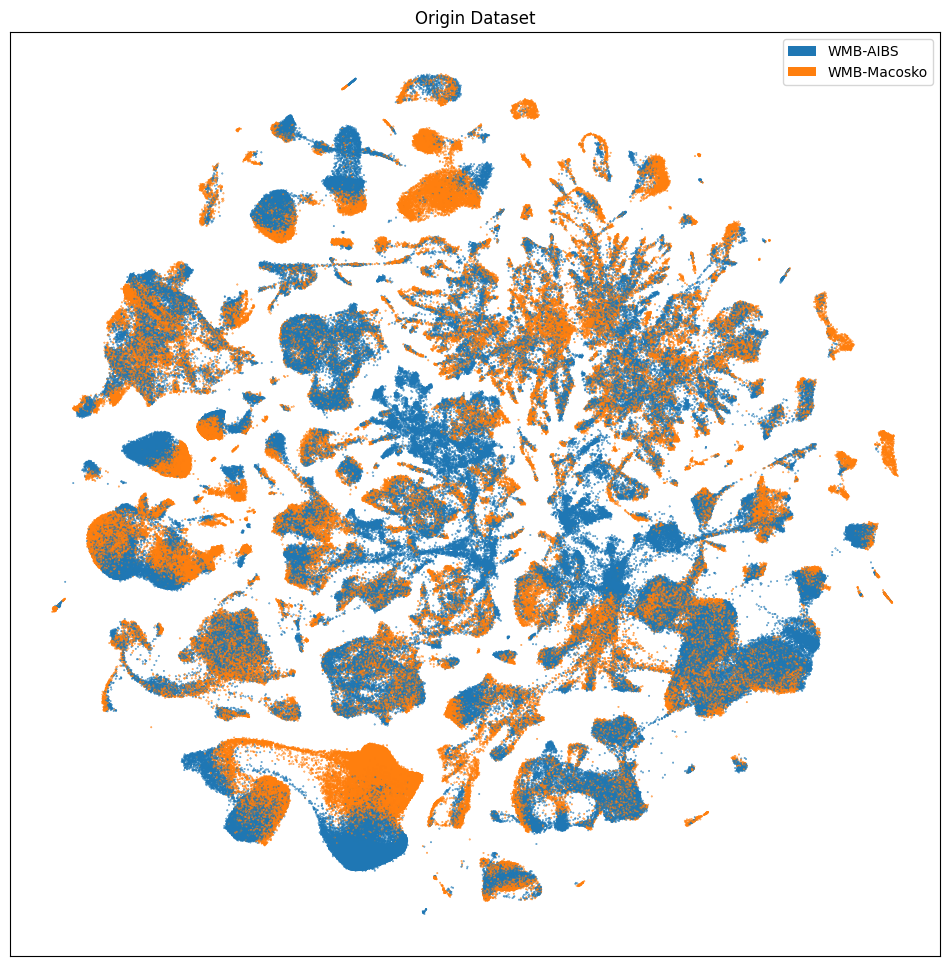

In [25]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['origin_dataset_color'],
    labels=sub_selected['origin_dataset'],
    term_orders=sub_selected['origin_dataset_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Origin Dataset")
plt.show()

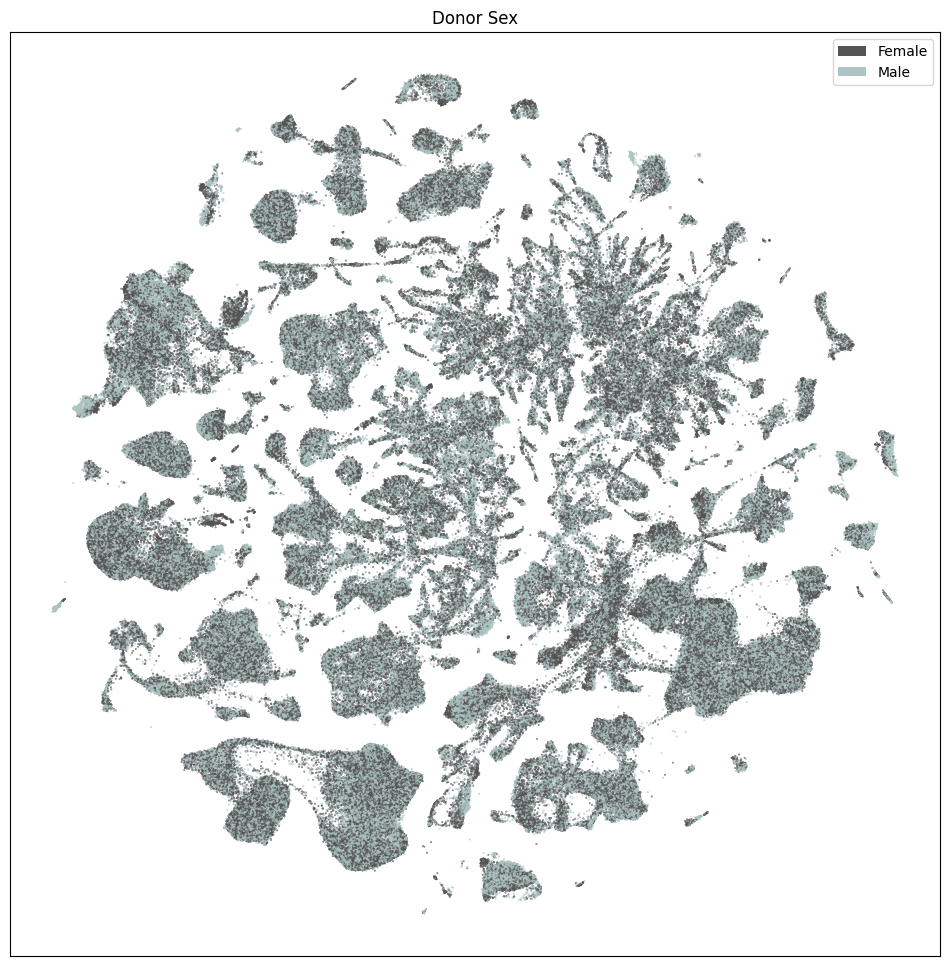

In [26]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['donor_sex_color'],
    labels=sub_selected['donor_sex'],
    term_orders=sub_selected['donor_sex_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Donor Sex")
plt.show()

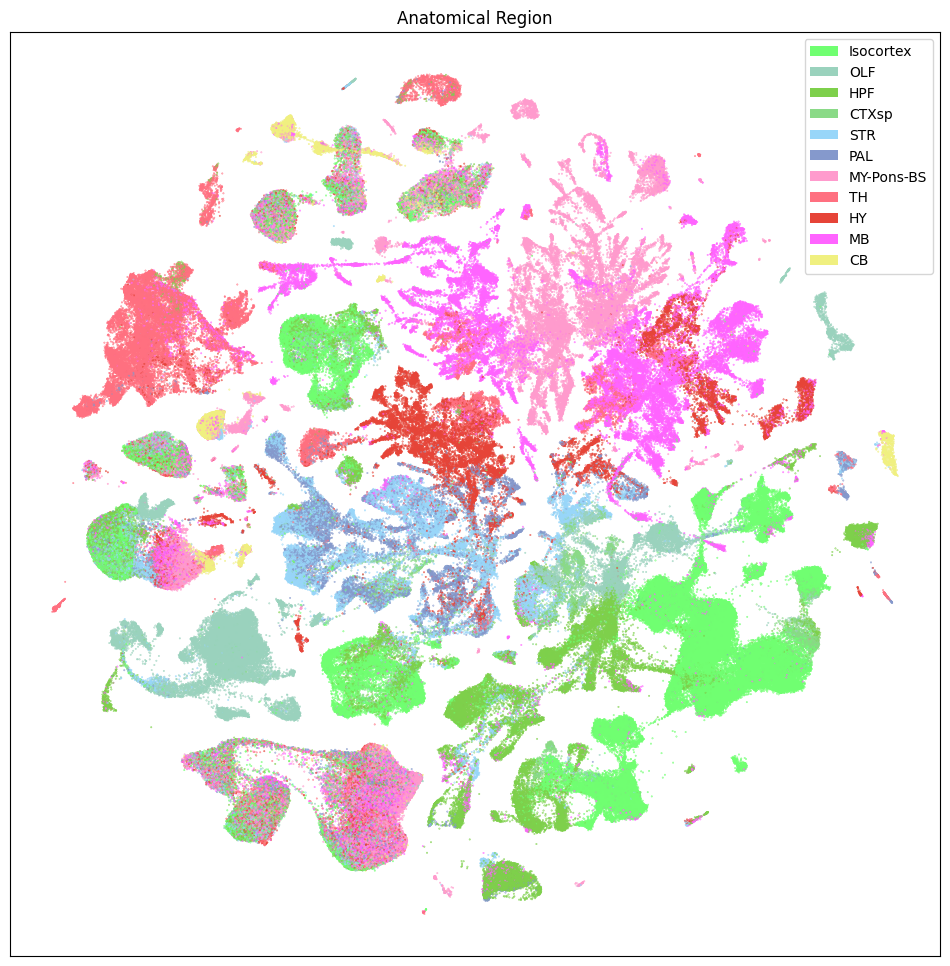

In [27]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['anatomical_division_label_color'],
    labels=sub_selected['anatomical_division_label'],
    term_orders=sub_selected['anatomical_division_label_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Anatomical Region")
plt.show()

## Taxonomy Information

The final set of metadata we load into our extended cell metadata file maps the cells into their assigned cluster in the taxonomy. We additionally load metadata for the clusters and compute useful information, such as the number of cells in each taxon at each level of the taxonomy.

First, we load information associated with each Cluster in the taxonomy. This includes a useful alias value for each cluster as well as the number of cells in each cluster.

In [28]:
cluster = abc_cache.get_metadata_dataframe('Consensus-WMB-integrated-taxonomy', 'cluster').set_index('label')
cluster.head()

,cluster_alias,number_of_cells
label,,
CS20251031_CLUS_0001,2721,16355
CS20251031_CLUS_0002,16574,1519
CS20251031_CLUS_0003,1736,307
CS20251031_CLUS_0004,1737,825
CS20251031_CLUS_0005,1743,4671


Next, we load the table that describes the levels in the taxonomy from Neighborhood at the highest to Cluster at the lowest level.

In [29]:
cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-integrated-taxonomy',
    file_name='cluster_annotation_term_set',
    skip_hash_check=True
).set_index('label')
cluster_annotation_term_set

,name,description,order,parent_term_set_label
label,,,,
CCN20251031_NEUR,neurotransmitter,neurotransmitter,0,NaN
CCN20251031_LEVEL_0,neighborhood,neighborhood,1,NaN
CCN20251031_LEVEL_1,class,class,2,CCN20251031_LEVEL_0
CCN20251031_LEVEL_2,subclass,subclass,3,CCN20251031_LEVEL_1
CCN20251031_LEVEL_3,supertype,supertype,4,CCN20251031_LEVEL_2
CCN20251031_LEVEL_4,cluster,cluster,5,CCN20251031_LEVEL_3


We load the annotation information defining all the taxons at all levels in the taxonomy. This also includes the term order and color associated with the taxon which we will use to plot later.

In [30]:
cluster_annotation_term = abc_cache.get_metadata_dataframe('Consensus-WMB-integrated-taxonomy', 'cluster_annotation_term').set_index('label')
cluster_annotation_term.head()

,name,cluster_annotation_term_set_label,cluster_annotation_term_set_name,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label
label,,,,,,,,,
CS20251031_NEUR_0004,Chol,CCN20251031_NEUR,neurotransmitter,#73E785,4,0,NaN,NaN,NaN
CS20251031_NEUR_0012,Chol-Dopa,CCN20251031_NEUR,neurotransmitter,#B8EC68,12,0,NaN,NaN,NaN
CS20251031_NEUR_0008,Dopa,CCN20251031_NEUR,neurotransmitter,#fcf04b,8,0,NaN,NaN,NaN
CS20251031_NEUR_0002,GABA,CCN20251031_NEUR,neurotransmitter,#FF3358,2,0,NaN,NaN,NaN
CS20251031_NEUR_0006,GABA-Chol,CCN20251031_NEUR,neurotransmitter,#000080,6,0,NaN,NaN,NaN


Finally, we load the cluster to cluster annotation membership table. Each row in this table is a mapping between a cluster and taxon in the taxonomy, including the clusters themselves. We'll use this table in a `groupby`s to allow us to count up the number of clusters at each taxonomy level and sum the number of cells in each taxon in the taxonomy a all levels.

In [31]:
cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-integrated-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
).set_index('cluster_annotation_term_label')
cluster_to_cluster_annotation_membership.head()

,cluster_annotation_term_set_name,cluster_annotation_term_name,cluster_alias,cluster_annotation_term_set_label
cluster_annotation_term_label,,,,
CS20251031_NEUR_0001,neurotransmitter,Glut,2721,CCN20251031_NEUR
CS20251031_NEUR_0001,neurotransmitter,Glut,16574,CCN20251031_NEUR
CS20251031_NEUR_0001,neurotransmitter,Glut,1736,CCN20251031_NEUR
CS20251031_NEUR_0001,neurotransmitter,Glut,1737,CCN20251031_NEUR
CS20251031_NEUR_0001,neurotransmitter,Glut,1743,CCN20251031_NEUR


In [32]:
membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)
membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()
membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)
membership_with_cluster_info.head()

,cluster_annotation_term_label,cluster_annotation_term_set_name,cluster_annotation_term_name,cluster_alias,cluster_annotation_term_set_label,number_of_cells,name,cluster_annotation_term_set_label_anno_term,cluster_annotation_term_set_name_anno_term,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label
0,CS20251031_NEUR_0001,neurotransmitter,Glut,2721,CCN20251031_NEUR,16355,Glut,CCN20251031_NEUR,neurotransmitter,#2B93DF,1,0,NaN,NaN,NaN
1,CS20251031_NEUR_0001,neurotransmitter,Glut,16574,CCN20251031_NEUR,1519,Glut,CCN20251031_NEUR,neurotransmitter,#2B93DF,1,0,NaN,NaN,NaN
2,CS20251031_NEUR_0001,neurotransmitter,Glut,1736,CCN20251031_NEUR,307,Glut,CCN20251031_NEUR,neurotransmitter,#2B93DF,1,0,NaN,NaN,NaN
3,CS20251031_NEUR_0001,neurotransmitter,Glut,1737,CCN20251031_NEUR,825,Glut,CCN20251031_NEUR,neurotransmitter,#2B93DF,1,0,NaN,NaN,NaN
4,CS20251031_NEUR_0001,neurotransmitter,Glut,1743,CCN20251031_NEUR,4671,Glut,CCN20251031_NEUR,neurotransmitter,#2B93DF,1,0,NaN,NaN,NaN


From the membership table, we create three tables via a `groupby`. First the alias of each cluster and its parents.

In [33]:
# term_sets = abc_cache.get_metadata_dataframe(directory='WHB-taxonomy', file_name='cluster_annotation_term_set').set_index('label')
cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_details = cluster_details[cluster_annotation_term_set['name']] # order columns
cluster_details.sort_values(['neighborhood', 'class', 'subclass', 'supertype', 'cluster'], inplace=True)
cluster_details.head()

cluster_annotation_term_set_name,neurotransmitter,neighborhood,class,subclass,supertype,cluster
cluster_alias,,,,,,
6562,GABA,HY-EA-Glut-GABA,011 CNU-HYa GABA,090 MEA-BST_Lhx6:Nfib_Gaba,0376 MEA-BST_Lhx6:Nfib_Gaba 1,1543 MEA-BST_Lhx6:Nfib_Gaba 1
6567,GABA,HY-EA-Glut-GABA,011 CNU-HYa GABA,090 MEA-BST_Lhx6:Nfib_Gaba,0376 MEA-BST_Lhx6:Nfib_Gaba 1,1544 MEA-BST_Lhx6:Nfib_Gaba 1
6576,GABA,HY-EA-Glut-GABA,011 CNU-HYa GABA,090 MEA-BST_Lhx6:Nfib_Gaba,0376 MEA-BST_Lhx6:Nfib_Gaba 1,1545 MEA-BST_Lhx6:Nfib_Gaba 1
6578,GABA,HY-EA-Glut-GABA,011 CNU-HYa GABA,090 MEA-BST_Lhx6:Nfib_Gaba,0376 MEA-BST_Lhx6:Nfib_Gaba 1,1546 MEA-BST_Lhx6:Nfib_Gaba 1
6579,GABA,HY-EA-Glut-GABA,011 CNU-HYa GABA,090 MEA-BST_Lhx6:Nfib_Gaba,0376 MEA-BST_Lhx6:Nfib_Gaba 1,1547 MEA-BST_Lhx6:Nfib_Gaba 1


Next the plotting order of each of the clusters and their parents.

In [34]:
cluster_order = membership_groupby['term_order'].first().unstack()
cluster_order.sort_values(['neighborhood', 'class', 'subclass', 'supertype', 'cluster'], inplace=True)
cluster_order.head()

cluster_annotation_term_set_name,class,cluster,neighborhood,neurotransmitter,subclass,supertype
cluster_alias,,,,,,
2721,1,1,1,1,1,1
16574,1,2,1,1,1,1
1736,1,3,1,1,1,2
1737,1,4,1,1,1,2
1743,1,5,1,1,1,2


Finally, the colors we will use to plot for each of the unique taxons at all levels.

In [35]:
cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]
cluster_colors.sort_values(
    ['neighborhood', 'class', 'subclass', 'supertype', 'cluster'],
    inplace=True
)
cluster_colors.head()

cluster_annotation_term_set_name,neurotransmitter,neighborhood,class,subclass,supertype,cluster
cluster_alias,,,,,,
8736,#2B93DF,#006200,#006200,#002099,#663D41,#8C4599
8734,#2B93DF,#006200,#006200,#002099,#99E0FF,#410F66
8730,#2B93DF,#006200,#006200,#002099,#99E0FF,#811799
8732,#2B93DF,#006200,#006200,#002099,#99E0FF,#FFE4E2
8738,#2B93DF,#006200,#006200,#002099,#99E0FF,#FFF49B


Next, we bring it all together by loading the mapping of cells to cluster and join into our final metadata table.

In [36]:
cell_to_cluster_membership = abc_cache.get_metadata_dataframe('Consensus-WMB-integrated-taxonomy', 'cell_to_cluster_membership').set_index('cell_label')
cell_to_cluster_membership.head()

,cluster_alias
cell_label,
CAGGTGCAGGCTAGCA-040_C01,5491
CGGACGTGTGTGAATA-063_B01,6268
GATCCCTTCGTGCACG-107_B01,6659
TCACGAACAACTGCGC-026_A01,6672
ACACCAAGTCAAACTC-026_B01,7067


We merge this table with information from our clusters.

In [37]:
cell_extended = cell_extended.join(cell_to_cluster_membership, rsuffix='_cell_to_cluster_membership', how='inner')
cell_extended = cell_extended.join(cluster_details, on='cluster_alias')
cell_extended = cell_extended.join(cluster_colors, on='cluster_alias', rsuffix='_color')
cell_extended = cell_extended.join(cluster_order, on='cluster_alias', rsuffix='_order')

del cell_to_cluster_membership

cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,library_method,alignment_id,region_of_interest_acronym,anatomical_division_label,donor_label,...,class_color,subclass_color,supertype_color,cluster_color,class_order,cluster_order,neighborhood_order,neurotransmitter_order,subclass_order,supertype_order
cell_label,,,,,,,,,,,,,,,,,,,,,
GACGCTGTCGCACGAC-426_C04,GACGCTGTCGCACGAC,426_C04,L8TX_201113_01_F06,WMB-10Xv3,WMB-10Xv3-P,10Xv3,1177903895,P,MY-Pons-BS,Snap25-IRES2-Cre;Ai14-550468,...,#858881,#653D66,#524F69,#2E7099,41,6661,9,25,404,1354
pBICCNsMMrCBDECiM006d190313c_TCCATCGCAGCAGTTT,TCCATCGCAGCAGTTT,NaN,pBICCNsMMrCBDECiM006d190313c,Consensus-WMB-Macosko-10X,Macosko-10X-CB,NaN,NaN,CB,CB,M006,...,#9D0208,#FF4826,#BC1010,#FFF4CC,35,6497,7,1,387,1299
CGAATTGAGGTCGTGA-478_B02,CGAATTGAGGTCGTGA,478_B02,L8TX_210107_02_F10,WMB-10Xv3,WMB-10Xv3-CB,10Xv3,1178469596,CB,CB,Snap25-IRES2-Cre;Ai14-556943,...,#9D0208,#FF4826,#BC1010,#99457A,35,6498,7,1,387,1299
pBICCNsMMrMBM6iM014d201007_CGGGACTCATCCGATA,CGGGACTCATCCGATA,NaN,pBICCNsMMrMBM6iM014d201007,Consensus-WMB-Macosko-10X,Macosko-10X-MB,NaN,NaN,MB,MB,M014,...,#594a26,#AD5CCC,#0F6635,#2C00FF,37,6508,9,25,392,1305
pBICCNsMMrTHT5iM013d210226A2_CTGCTCAAGAGTGTGC,CTGCTCAAGAGTGTGC,NaN,pBICCNsMMrTHT5iM013d210226A2,Consensus-WMB-Macosko-10X,Macosko-10X-TH,NaN,NaN,TH,TH,M013,...,#03045E,#99FFBC,#564860,#5A662E,39,6613,9,25,401,1346


In [38]:
print_column_info(cell_extended)

Number of unique cell_barcode = 3578991 
Number of unique barcoded_cell_sample_label = 781 
Number of unique library_label = 1434 
Number of unique dataset_label = 3 ['Consensus-WMB-Macosko-10X', 'WMB-10Xv2', 'WMB-10Xv3']
Number of unique feature_matrix_label = 33 
Number of unique library_method = 2 ['10Xv2', '10Xv3']
Number of unique alignment_id = 781 
Number of unique region_of_interest_acronym = 42 
Number of unique anatomical_division_label = 11 ['CB', 'CTXsp', 'HPF', 'HY', 'Isocortex', 'MB', 'MY-Pons-BS', 'OLF', 'PAL', 'STR', 'TH']
Number of unique donor_label = 373 
Number of unique donor_sex = 2 ['Female', 'Male']
Number of unique donor_age = 22 ['51 days', '52 days', '53 days', '54 days', '55 days', '56 days', '57 days', '58 days', '59 days', '60 days', '61 days', '62 days', '63 days', '64 days', '65 days', '66 days', '67 days', '68 days', '69 days', '70 days', '71 days', 'unknown']
Number of unique origin_dataset = 2 ['WMB-AIBS', 'WMB-Macosko']
Number of unique origin_datase

### Plotting the taxonomy

Now that we have our cells with associated taxonomy information, we'll plot them into the UMAP we showed previously.

Below we plot the taxonomy mapping of the cells for each level in the taxonomy. We use the labels and their orders to plot them in a legend. We omit the legends the lower levels as the legends become too busy.

In [39]:
sub_selected = cell_extended[::10]

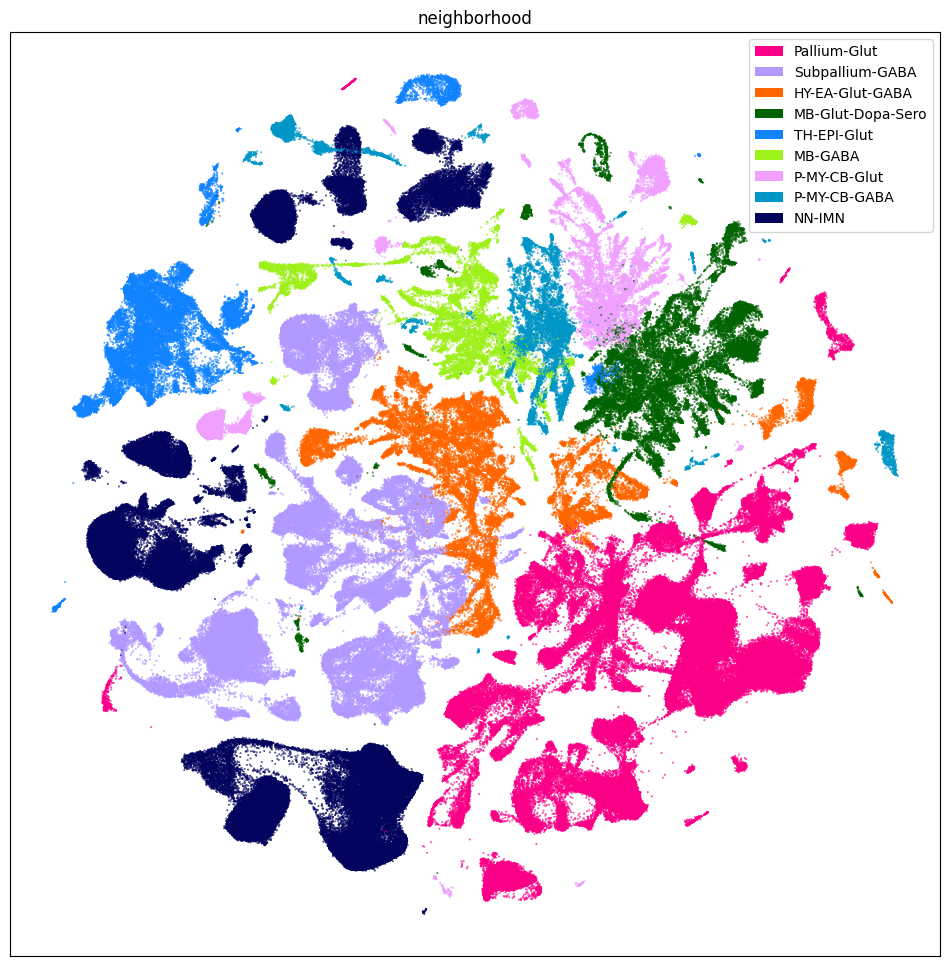

In [40]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['neighborhood_color'],
    labels=sub_selected['neighborhood'],
    term_orders=sub_selected['neighborhood_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("neighborhood")
plt.show()

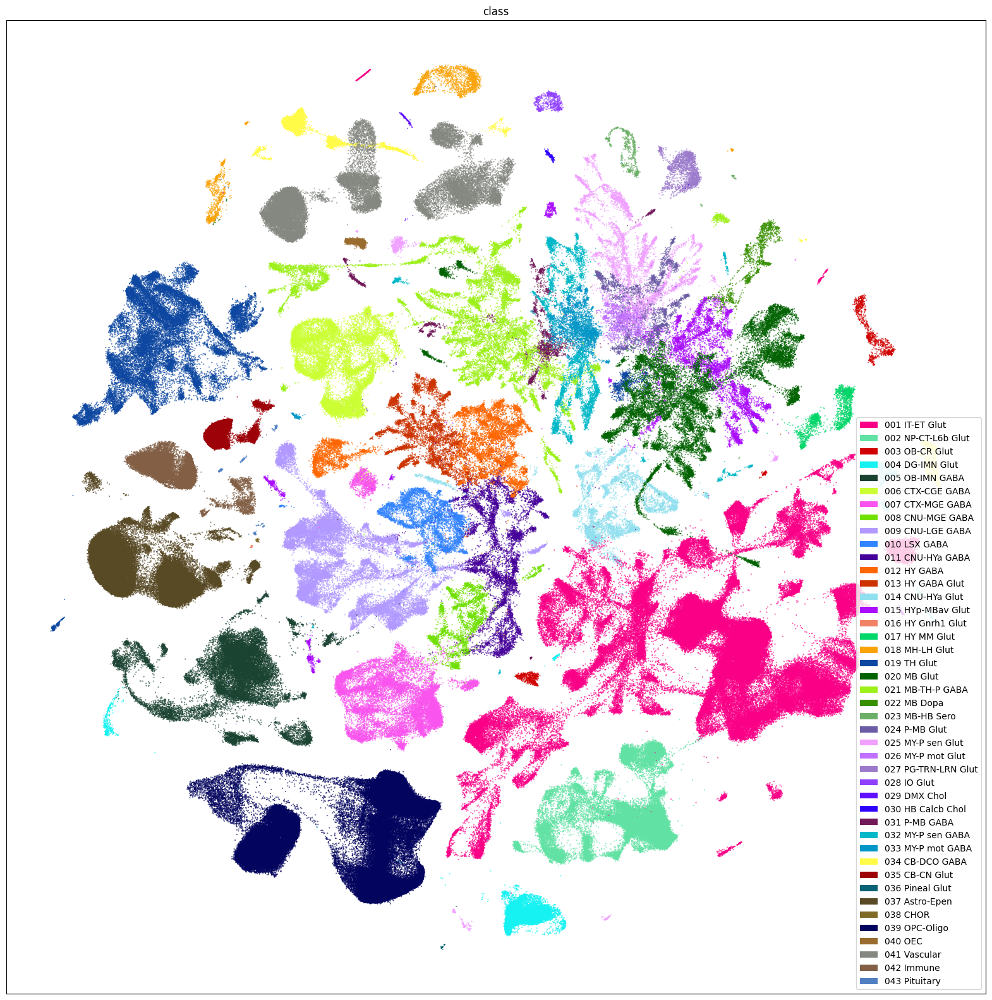

In [41]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['class_color'],
    labels=sub_selected['class'],
    term_orders=sub_selected['class_order'],
    fig_width=20,
    fig_height=20
)
res = ax.set_title("class")
plt.show()

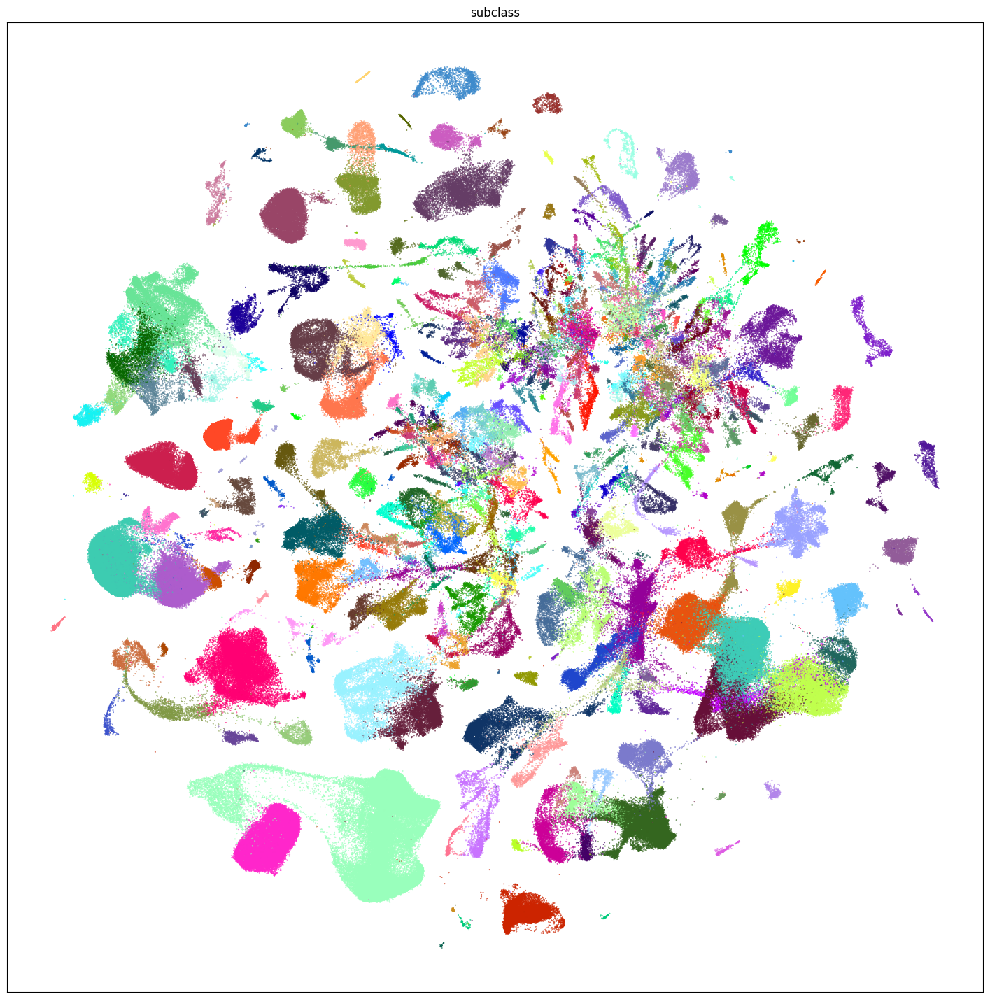

In [42]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['subclass_color'],
    fig_width=18,
    fig_height=18
)
res = ax.set_title("subclass")
plt.show()

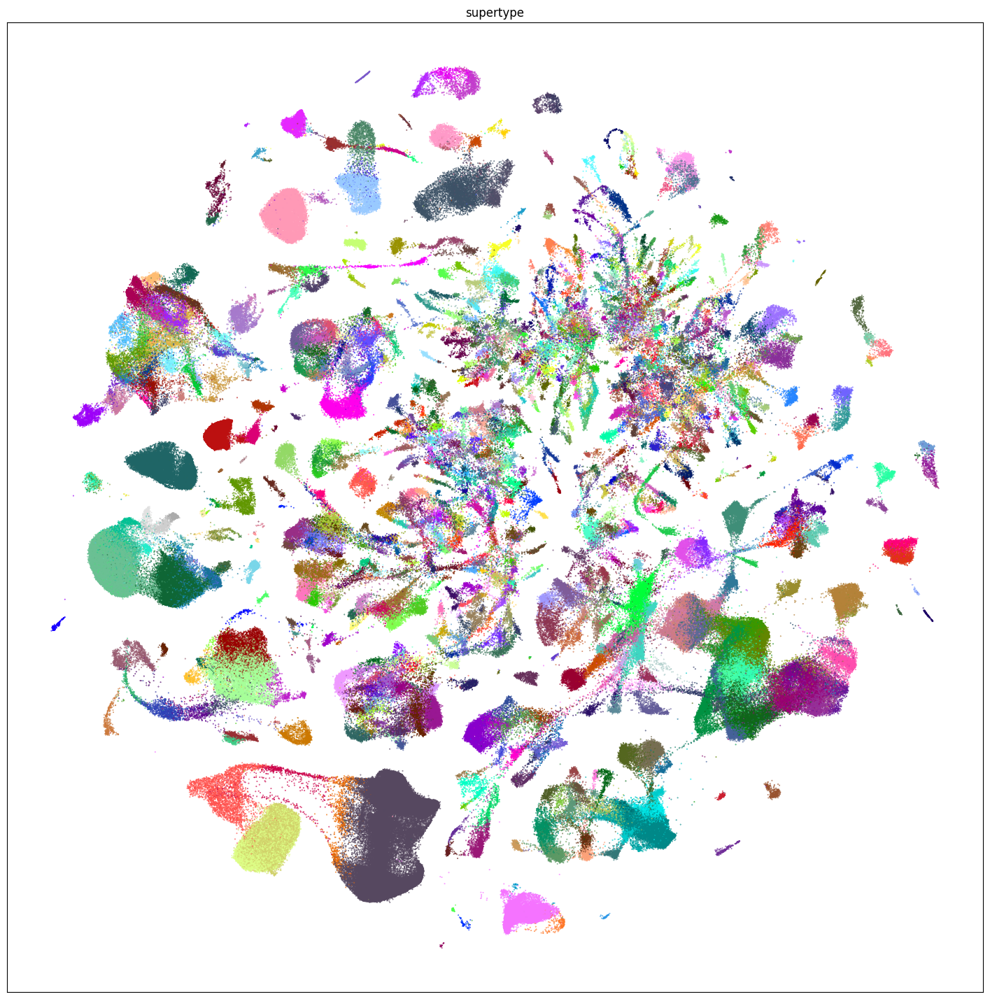

In [43]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['supertype_color'],
    fig_width=18,
    fig_height=18
)
res = ax.set_title("supertype")
plt.show()

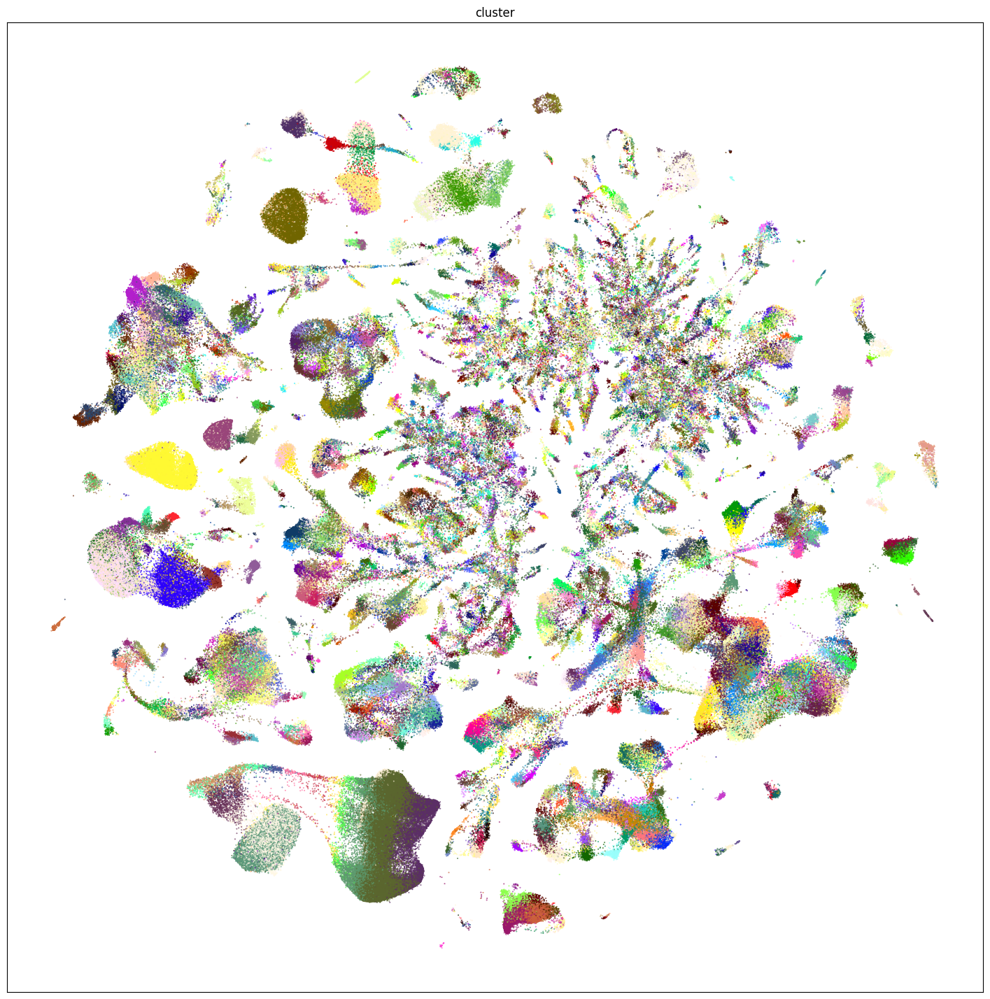

In [44]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['cluster_color'],
    fig_width=18,
    fig_height=18
)
res = ax.set_title("cluster")
plt.show()

Additionally, we plot by neurotransmitter.

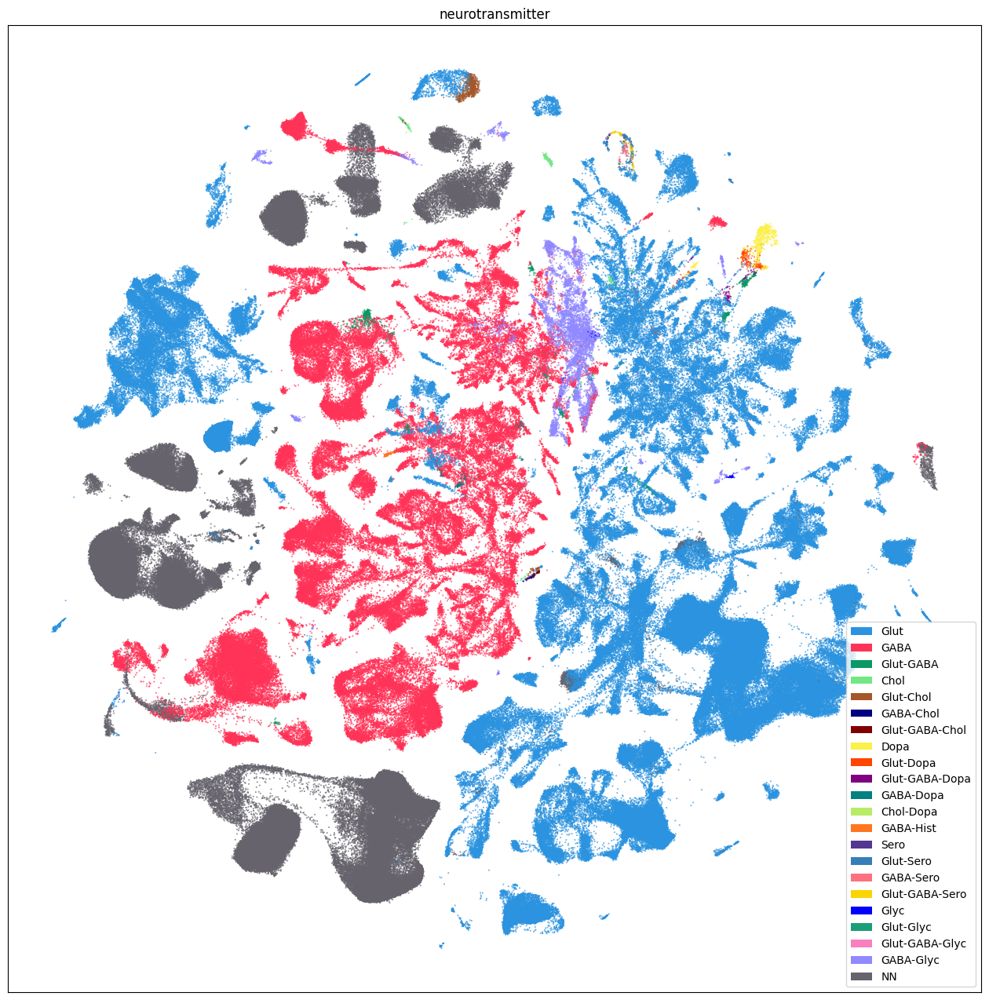

In [45]:
fig, ax = plot_umap(
    sub_selected['x'],
    sub_selected['y'],
    cc=sub_selected['neurotransmitter_color'],
    labels=sub_selected['neurotransmitter'],
    term_orders=sub_selected['neurotransmitter_order'],
    fig_width=16,
    fig_height=16
)
res = ax.set_title("neurotransmitter")
plt.show()

#### Neighborhood UMAPS

The release also provides individual UMAPs for cells in each of the 9 neighborhoods.

We first subselect one of these neighborhoods, 'Pallium-Glut'. Note that similar masking can for any column/value pair can be done as well. For instance `cell_extended[cell_extended['class'] == '001 L1-ET Glut']` will return a DataFrame with only cells in the class 001 L1-ET Glut.

In [46]:
neighborhood_cells = cell_extended[cell_extended['neighborhood'] == 'Pallium-Glut']
neighborhood_cells.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,library_method,alignment_id,region_of_interest_acronym,anatomical_division_label,donor_label,...,class_color,subclass_color,supertype_color,cluster_color,class_order,cluster_order,neighborhood_order,neurotransmitter_order,subclass_order,supertype_order
cell_label,,,,,,,,,,,,,,,,,,,,,
pBICCNsMMrCTXANGiF021d210525C2_GACAGCCGTGTACGCC,GACAGCCGTGTACGCC,NaN,pBICCNsMMrCTXANGiF021d210525C2,Consensus-WMB-Macosko-10X,Macosko-10X-Isocortex,NaN,NaN,CTX,Isocortex,F021,...,#FA0087,#660F38,#456199,#FBFFAE,1,78,1,1,4,19
CCTAGCTCACGAAAGC-070_B01,CCTAGCTCACGAAAGC,070_B01,L8TX_181206_01_E12,WMB-10Xv2,WMB-10Xv2-Isocortex-1,10Xv2,1178471645,MO-FRP,Isocortex,Snap25-IRES2-Cre;Ai14-426004,...,#61e2a4,#34661F,#00EEEE,#30660F,2,572,1,1,35,133
pBICCNsMMrVISiF022d210719A1_ACAGAAAGTCTTCGAA,ACAGAAAGTCTTCGAA,NaN,pBICCNsMMrVISiF022d210719A1,Consensus-WMB-Macosko-10X,Macosko-10X-Isocortex,NaN,NaN,VIS,Isocortex,F022,...,#FA0087,#999145,#3F8E78,#FFFF00,1,6,1,1,1,2
pBICCNsMMrACAiF019d210630A6_AGAACAACAGCGTACC,AGAACAACAGCGTACC,NaN,pBICCNsMMrACAiF019d210630A6,Consensus-WMB-Macosko-10X,Macosko-10X-Isocortex,NaN,NaN,ACA,Isocortex,F019,...,#FA0087,#3DCCB7,#638600,#661B0F,1,47,1,1,3,11
GTCTGTCCAATCACGT-480_A04,GTCTGTCCAATCACGT,480_A04,L8TX_210107_01_F09,WMB-10Xv3,WMB-10Xv3-Isocortex-1,10Xv3,1178469599,VIS,Isocortex,Snap25-IRES2-Cre;Ai14-556846,...,#FA0087,#E9530F,#5C6899,#F0FF9B,1,27,1,1,2,6


Now we load and join in the coordinates of the neighborhood UMAP. Note the inner join and the suffix added to the joined DataFrame as we already have 'x' and 'y' columns.

In [47]:
neighborhood_cells = neighborhood_cells.join(
    abc_cache.get_metadata_dataframe(
        'Consensus-WMB-integrated-taxonomy',
        'Pallium-Glut_cell_2d_embedding_coordinates'
        ).set_index('cell_label'),
    how='inner',
    rsuffix='_pallium_glut'
)
neighborhood_cells.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,library_method,alignment_id,region_of_interest_acronym,anatomical_division_label,donor_label,...,supertype_color,cluster_color,class_order,cluster_order,neighborhood_order,neurotransmitter_order,subclass_order,supertype_order,x_pallium_glut,y_pallium_glut
cell_label,,,,,,,,,,,,,,,,,,,,,
pBICCNsMMrCTXANGiF021d210525C2_GACAGCCGTGTACGCC,GACAGCCGTGTACGCC,NaN,pBICCNsMMrCTXANGiF021d210525C2,Consensus-WMB-Macosko-10X,Macosko-10X-Isocortex,NaN,NaN,CTX,Isocortex,F021,...,#456199,#FBFFAE,1,78,1,1,4,19,14.378285,14.850556
CCTAGCTCACGAAAGC-070_B01,CCTAGCTCACGAAAGC,070_B01,L8TX_181206_01_E12,WMB-10Xv2,WMB-10Xv2-Isocortex-1,10Xv2,1178471645,MO-FRP,Isocortex,Snap25-IRES2-Cre;Ai14-426004,...,#00EEEE,#30660F,2,572,1,1,35,133,19.161156,14.687316
pBICCNsMMrVISiF022d210719A1_ACAGAAAGTCTTCGAA,ACAGAAAGTCTTCGAA,NaN,pBICCNsMMrVISiF022d210719A1,Consensus-WMB-Macosko-10X,Macosko-10X-Isocortex,NaN,NaN,VIS,Isocortex,F022,...,#3F8E78,#FFFF00,1,6,1,1,1,2,8.557347,16.247175
pBICCNsMMrACAiF019d210630A6_AGAACAACAGCGTACC,AGAACAACAGCGTACC,NaN,pBICCNsMMrACAiF019d210630A6,Consensus-WMB-Macosko-10X,Macosko-10X-Isocortex,NaN,NaN,ACA,Isocortex,F019,...,#638600,#661B0F,1,47,1,1,3,11,10.338338,13.062096
GTCTGTCCAATCACGT-480_A04,GTCTGTCCAATCACGT,480_A04,L8TX_210107_01_F09,WMB-10Xv3,WMB-10Xv3-Isocortex-1,10Xv3,1178469599,VIS,Isocortex,Snap25-IRES2-Cre;Ai14-556846,...,#5C6899,#F0FF9B,1,27,1,1,2,6,11.338059,12.067234


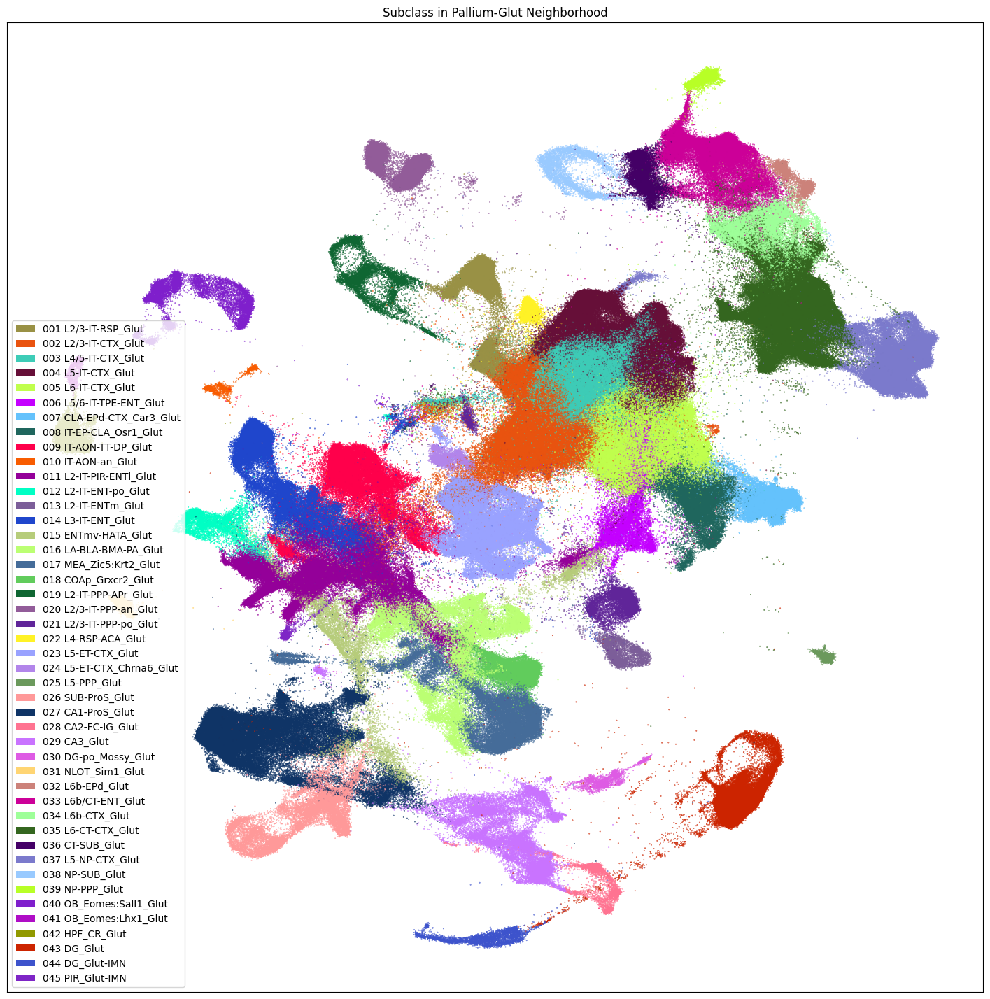

In [48]:
fig, ax = plot_umap(
    neighborhood_cells['x_pallium_glut'],
    neighborhood_cells['y_pallium_glut'],
    cc=neighborhood_cells['subclass_color'],
    labels=neighborhood_cells['subclass'],
    term_orders=neighborhood_cells['subclass_order'],
    fig_width=18,
    fig_height=18
)
res = ax.set_title("Subclass in Pallium-Glut Neighborhood")
plt.show()

Below is a block of code that will plot a given term (e.g. taxonomy class, origin_dataset, donor_sex) in each of the 9 neighborhood UMAPS. Change the value in term_to_plot to any of the other columns we used above to visualize that data in each of the 9 neighborhoods.

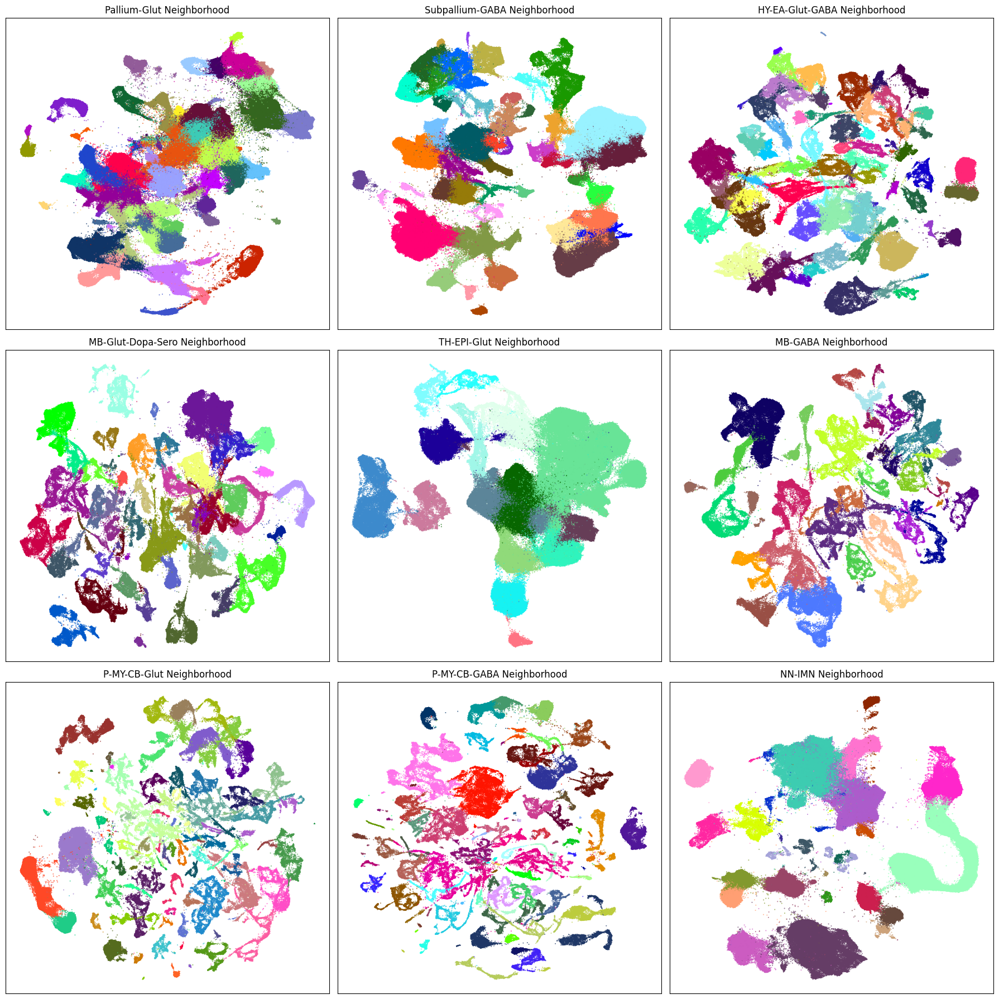

In [49]:
term_to_plot = 'subclass' # Change to other term (e.g. taxonomy level, anatomical, donor_sex etc.)
# Loop through all neighborhoods and plot subclass UMAPs ordered by term_order.
fig, ax = plt.subplots(3, 3)
fig.set_size_inches(18, 18)
ax = ax.flatten()

for idx, neighborhood in enumerate(cluster_annotation_term[
        cluster_annotation_term['cluster_annotation_term_set_name'] == 'neighborhood'
        ].sort_values('term_order')['name']):
    neighborhood_cells = cell_extended.join(
        abc_cache.get_metadata_dataframe(
            'Consensus-WMB-integrated-taxonomy',
            f'{neighborhood}_cell_2d_embedding_coordinates'
            ).set_index('cell_label'),
        how='inner',
        rsuffix=f'_{neighborhood}'
    )
    plot_umap(
        neighborhood_cells['x_' + neighborhood],
        neighborhood_cells['y_' + neighborhood],
        cc=neighborhood_cells[term_to_plot + '_color'],
        fig=fig,
        ax=ax[idx]
    )
    res = ax[idx].set_title(f"{neighborhood} Neighborhood")
plt.tight_layout()
plt.show()

## Aggregating cluster and cells counts.

Let's investigate the taxonomy information a bit more. In this section, we'll create bar plots showing the number of clusters and cells at each level in the taxonomy.

First, we need to compute the number of clusters that are in each of the cell type taxons above it.

In [50]:
term_cluster_count = membership_with_cluster_info.reset_index().groupby(
        ['cluster_annotation_term_label']
    )[['cluster_alias']].count()
term_cluster_count.columns = ['number_of_clusters']
term_cluster_count.head()

,number_of_clusters
cluster_annotation_term_label,
CS20251031_CLAS_0001,518
CS20251031_CLAS_0002,98
CS20251031_CLAS_0003,24
CS20251031_CLAS_0004,25
CS20251031_CLAS_0005,167


Next we sum the cells that are associated for each level in the taxonomy.

In [51]:
term_cell_count = membership_with_cluster_info.reset_index().groupby(
    ['cluster_annotation_term_label']
)[['number_of_cells']].sum()
term_cell_count.head()

,number_of_cells
cluster_annotation_term_label,
CS20251031_CLAS_0001,1628174
CS20251031_CLAS_0002,386033
CS20251031_CLAS_0003,17251
CS20251031_CLAS_0004,142462
CS20251031_CLAS_0005,218309


In [52]:
# Join counts with the term dataframe
term_with_counts = cluster_annotation_term.join(term_cluster_count)
term_with_counts = term_with_counts.join(term_cell_count)
term_with_counts.head()

,name,cluster_annotation_term_set_label,cluster_annotation_term_set_name,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label,number_of_clusters,number_of_cells
label,,,,,,,,,,,
CS20251031_NEUR_0004,Chol,CCN20251031_NEUR,neurotransmitter,#73E785,4,0,NaN,NaN,NaN,25,3632
CS20251031_NEUR_0012,Chol-Dopa,CCN20251031_NEUR,neurotransmitter,#B8EC68,12,0,NaN,NaN,NaN,1,261
CS20251031_NEUR_0008,Dopa,CCN20251031_NEUR,neurotransmitter,#fcf04b,8,0,NaN,NaN,NaN,24,7207
CS20251031_NEUR_0002,GABA,CCN20251031_NEUR,neurotransmitter,#FF3358,2,0,NaN,NaN,NaN,2332,1301636
CS20251031_NEUR_0006,GABA-Chol,CCN20251031_NEUR,neurotransmitter,#000080,6,0,NaN,NaN,NaN,3,397


Below we create a function to plot the cluster and cell counts in a bar graph, coloring by the associated taxon level.

In [53]:
def bar_plot_by_level_and_type(df: pd.DataFrame, level: str, fig_width: float = 8.5, fig_height: float = 8.5):
    """Plot the number of cells by the specified level.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing cluster annotation terms with counts.
    level : str
        The level of the taxonomy to plot (e.g., 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster').
    fig_width : float, optional
        Width of the figure in inches. Default is 8.5.
    fig_height : float, optional
        Height of the figure in inches. Default is 4.
    """

    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(fig_width, fig_height)

    for idx, ctype in enumerate(['clusters', 'cells']):

        pred = (df['cluster_annotation_term_set_name'] == level)
        sort_order = np.argsort(df[pred]['term_order'])
        names = df[pred]['name'].iloc[sort_order]
        counts = df[pred]['number_of_%s' % ctype].iloc[sort_order]
        colors = df[pred]['color_hex_triplet'].iloc[sort_order]
        
        ax[idx].barh(names[::-1], counts[::-1], color=colors[::-1])
        ax[idx].set_title('Number of %s by %s' % (ctype,level))
        ax[idx].set_xlabel('Number of %s' % ctype)
        if ctype == 'cells':
            ax[idx].set_xscale('log')
        
        if idx > 0:
            ax[idx].set_yticklabels([])

    return fig, ax

Now, we plot bar graphs of the number of clusters and cells by taxonomy level. Below we show neighborhood and class, but this comparison can be made for all levels in the taxonomy. 

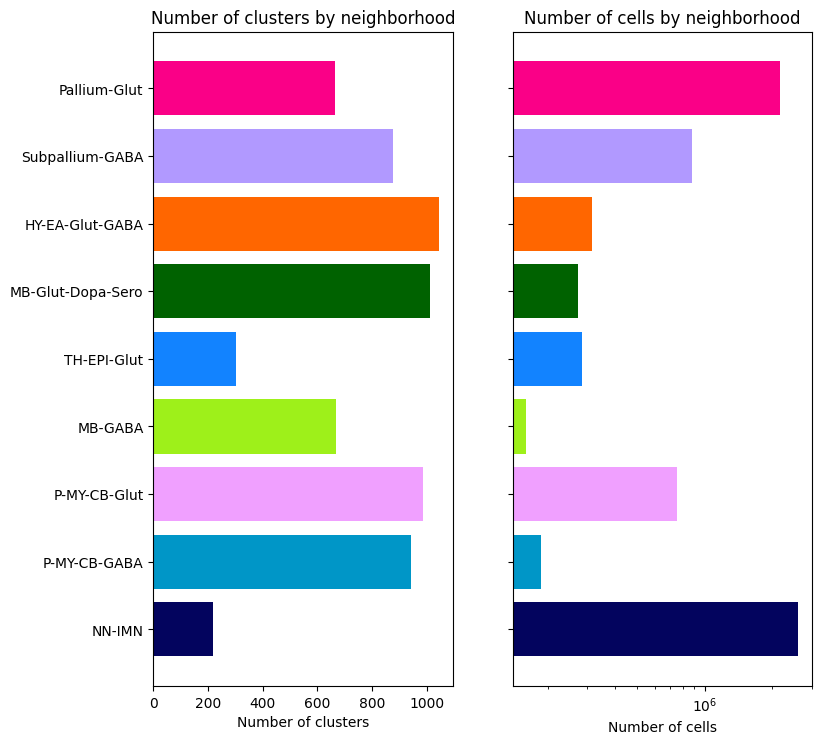

In [54]:
fig, ax = bar_plot_by_level_and_type(term_with_counts, 'neighborhood')
plt.show()

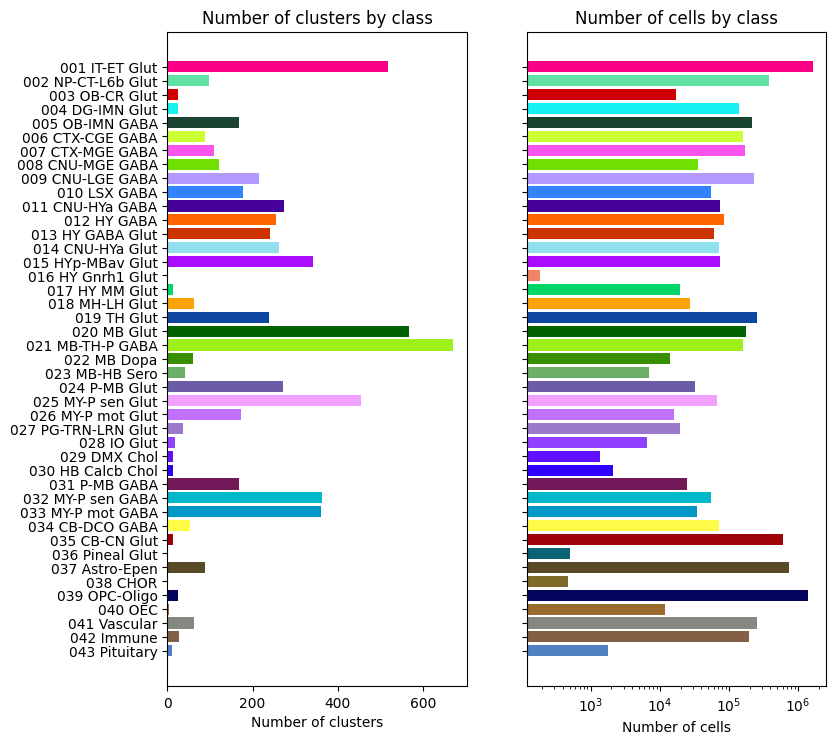

In [55]:
fig, ax = bar_plot_by_level_and_type(term_with_counts, 'class')
plt.show()

### Visualizing the  taxonomy

Finally, we create a pie chart for Neighborhood, Class, Subclass, and Supertype. This is plotted in such a way that the inner rings are all children of the parent taxon above. The width's of the pie colors are given by the number of clusters in taxon.

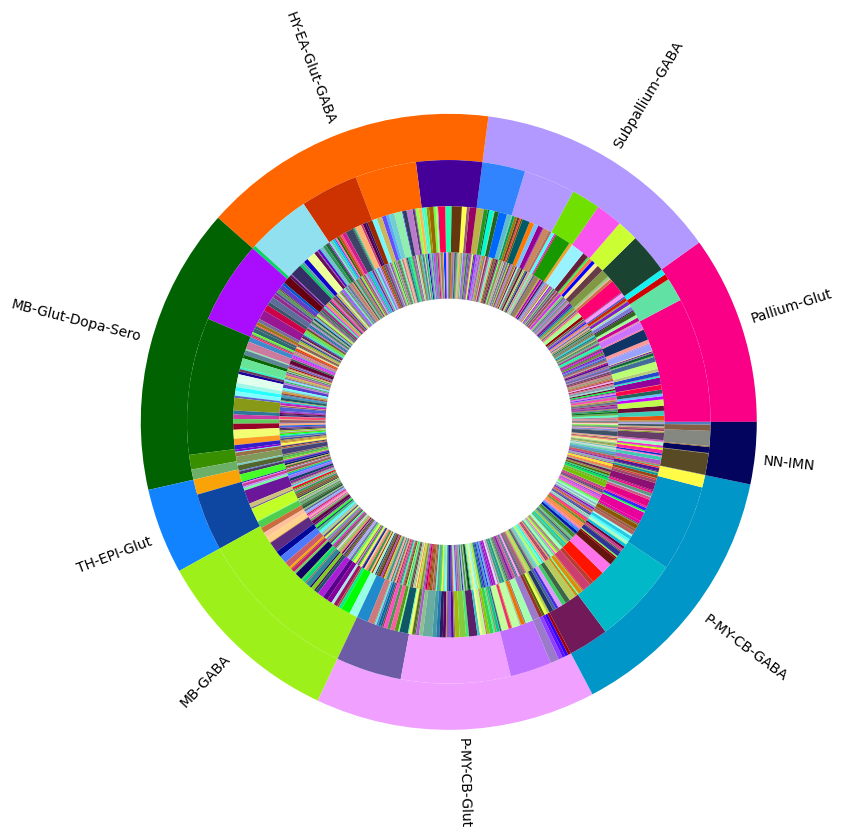

In [56]:
levels = ['neighborhood', 'class', 'subclass', 'supertype']
df = {}

# Copy the term order of the parent into each of the level below it.
term_with_counts['parent_order'] = ""
for idx, row in term_with_counts.iterrows():
    if pd.isna(row['parent_term_label']):
        continue
    term_with_counts.loc[idx, 'parent_order'] = term_with_counts.loc[row['parent_term_label']]['term_order']

term_with_counts = term_with_counts.reset_index()
for lvl in levels:
    pred = term_with_counts['cluster_annotation_term_set_name'] == lvl
    df[lvl] = term_with_counts[pred]
    df[lvl] = df[lvl].sort_values(['parent_order', 'term_order'])

fig, ax = plt.subplots()
fig.set_size_inches(10, 10)
size = 0.15

for i, lvl in enumerate(levels):
    
    if lvl == 'neighborhood':
        ax.pie(df[lvl]['number_of_clusters'],
               colors=df[lvl]['color_hex_triplet'],
               labels = df[lvl]['name'],
               rotatelabels=True,
               labeldistance=1.025,
               radius=1,
               wedgeprops=dict(width=size, edgecolor=None),
               startangle=0)
    else :
        ax.pie(df[lvl]['number_of_clusters'],
               colors=df[lvl]['color_hex_triplet'],
               radius=1-i*size,
               wedgeprops=dict(width=size, edgecolor=None),
               startangle=0)
term_with_counts = term_with_counts.set_index('label')
plt.show()

In the [next notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_10X_snRNASeq.html), we'll explore the gene expression data and combine them with the taxonomy and cell level metadata. You can also explore the previously released Whole Mouse Brain ([WMB-10X](https://alleninstitute.github.io/abc_atlas_access/descriptions/WMB-10X.html)) through the notebooks linked [here](https://alleninstitute.github.io/abc_atlas_access/descriptions/notebook_subtitle1.html).